**Name**: Anirudh Rao

**Roll No.**: BE21B004



---



We will import some additional libraries.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import random
import os
import shutil
import cv2
import warnings

In [2]:
warnings.filterwarnings('ignore')

# Task 1

We unzip the data shared as part of this assignment using the command line tools provided by Google Colab.

In [ ]:
!unzip /content/drive/MyDrive/visual-taxonomy.zip -d /content/visual-taxonomy/

We then read in the dataset of categories and attributes in order to create the required baskets.

In [4]:
df = pd.read_csv('/content/visual-taxonomy/train.csv')

In [5]:
df.head()

,id,Category,len,attr_1,attr_2,attr_3,attr_4,attr_5,attr_6,attr_7,attr_8,attr_9,attr_10
0,0,Men Tshirts,5,default,round,printed,default,short sleeves,NaN,NaN,NaN,NaN,NaN
1,1,Men Tshirts,5,multicolor,polo,solid,solid,short sleeves,NaN,NaN,NaN,NaN,NaN
2,2,Men Tshirts,5,default,polo,solid,solid,short sleeves,NaN,NaN,NaN,NaN,NaN
3,3,Men Tshirts,5,multicolor,polo,solid,solid,short sleeves,NaN,NaN,NaN,NaN,NaN
4,4,Men Tshirts,5,multicolor,polo,solid,solid,short sleeves,NaN,NaN,NaN,NaN,NaN


For each of the 5 categories, we pick those 2 attributes that have the least number of NaN values in that category. Thus, we form 10 (category, attribute) pairs.

In [6]:
attributes = dict()

for category in df["Category"].value_counts().index:
    temp_df = df[df["Category"] == category].drop(["id","Category","len"],axis=1)
    attributes[category] = list(temp_df.isna().sum().sort_values(ascending=True)[:2].index)

In [7]:
attributes

{'Women Tops & Tunics': ['attr_1', 'attr_8'],
 'Women Tshirts': ['attr_1', 'attr_5'],
 'Sarees': ['attr_4', 'attr_10'],
 'Men Tshirts': ['attr_2', 'attr_1'],
 'Kurtis': ['attr_8', 'attr_9']}

For each basket, we sample 100 images from the set of images that do not have a NaN value for the chosen (category, attribute) pair.

In [8]:
random.seed(5401)

samples = dict()

for category in attributes.keys():
    for attribute in attributes[category]:
        temp_df = df[df["Category"] == category].dropna(axis=0, subset=[attribute])
        samples[(category,attribute)] = list(random.sample(list(temp_df.index),100))

We can see that we have chosen 100 images for each basket.

In [9]:
for key,value in samples.items():
    print(key,"-",len(value))

('Women Tops & Tunics', 'attr_1') - 100
('Women Tops & Tunics', 'attr_8') - 100
('Women Tshirts', 'attr_1') - 100
('Women Tshirts', 'attr_5') - 100
('Sarees', 'attr_4') - 100
('Sarees', 'attr_10') - 100
('Men Tshirts', 'attr_2') - 100
('Men Tshirts', 'attr_1') - 100
('Kurtis', 'attr_8') - 100
('Kurtis', 'attr_9') - 100


In [10]:
print(samples[('Men Tshirts', 'attr_1')])

[3633, 4564, 211, 1322, 4180, 4495, 4909, 2907, 5163, 859, 5694, 4877, 201, 485, 6718, 1496, 3780, 624, 3419, 1254, 4634, 505, 2309, 6555, 1994, 15, 750, 416, 3447, 2463, 205, 2376, 3231, 3494, 4916, 1314, 3489, 5044, 991, 3043, 2449, 2998, 646, 1264, 2063, 2870, 2108, 5526, 1759, 2412, 146, 5417, 2608, 2062, 3879, 1186, 982, 6754, 3495, 1699, 195, 4747, 3269, 6510, 1501, 3449, 936, 3057, 3316, 977, 184, 4290, 6805, 2, 3974, 3535, 5421, 5615, 6856, 6314, 5251, 3111, 3127, 6216, 1789, 3004, 536, 3994, 6780, 1790, 1221, 1611, 1244, 4700, 1288, 736, 5935, 1649, 5482, 2427]


We separate the sampled images from the folder containing all 70000+ training images by creating a new folder.

In [11]:
selected_images = set()

for value in samples.values():
    selected_images = selected_images.union(set(value))

filenames = [str(i).zfill(6) for i in selected_images]

new_folder = "selected_images"
os.makedirs(new_folder, exist_ok=True)

for filename in filenames:
    source_path = os.path.join("/content/visual-taxonomy/train_images", filename + ".jpg")
    destination_path = os.path.join(new_folder, filename + ".jpg")

    if os.path.exists(source_path):
        shutil.copy2(source_path, destination_path)

We have thus created 10 baskets, each with 100 images.

# Task 2 and Task 3

We then load in the RGB data of each of the selected images and store them in a Pandas DataFrame. Each of the images is resized to a fixed dimension to ensure that the data fits in the DataFrame with no NaN values.

In [12]:
image_data = dict()
full_image_data = dict()
for filename in filenames:
    img = cv2.cvtColor(cv2.imread("/content/selected_images/" + filename + ".jpg", cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (32, 32))
    full_image_data[filename] = img
    img = img.flatten()
    image_data[filename] = img

In [13]:
image_df = pd.DataFrame(image_data).T

In [14]:
image_df

,0,1,2,3,4,5,6,7,8,9,...,3062,3063,3064,3065,3066,3067,3068,3069,3070,3071
000002,255,255,255,255,255,255,255,255,255,255,...,196,205,185,185,222,179,166,253,253,253
061444,31,92,162,30,91,160,31,92,160,36,...,214,96,157,213,96,157,212,98,157,213
036870,237,235,238,241,239,242,234,232,233,243,...,181,191,191,193,224,222,225,198,198,200
004104,255,255,255,255,255,255,192,208,216,194,...,255,255,255,255,15,5,6,42,69,77
061450,255,255,255,255,255,255,255,255,255,255,...,255,255,255,255,255,255,255,255,255,255
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
002029,255,255,255,255,255,255,255,255,255,255,...,251,255,255,255,255,255,255,255,255,255
026606,255,255,255,255,255,255,255,255,255,255,...,255,255,255,255,255,255,255,255,255,255
069618,255,255,255,255,255,255,255,255,255,255,...,255,255,255,255,255,255,255,255,255,255
057336,44,47,23,102,105,83,15,13,5,90,...,190,112,118,55,128,132,79,148,149,113


We then use the `plot_components` function taught in class to perform the required visualizations.

In [15]:
from matplotlib import offsetbox

def plot_components(data, model, images=None, ax=None, thumb_frac=0.05):

    ax = ax or plt.gca()

    proj = model.fit_transform(data)
    ax.plot(proj[:, 0], proj[:, 1], '.k')
    ax.set_xlabel("Component 1")
    ax.set_ylabel("Component 2")

    if images is not None:
        min_dist_2 = (thumb_frac * max(proj.max(0) - proj.min(0))) ** 2
        shown_images = np.array([2 * proj.max(0)])
        for i in range(data.shape[0]):
            dist = np.sum((proj[i] - shown_images) ** 2, 1)
            if np.min(dist) < min_dist_2:
                continue
            shown_images = np.vstack([shown_images, proj[i]])
            imagebox = offsetbox.AnnotationBbox(offsetbox.OffsetImage(images[i]), proj[i])
            ax.add_artist(imagebox)

**Isomap**

We first perform dimensionality reduction using Isomap.

In [16]:
from sklearn.manifold import Isomap
model1 = Isomap(n_components=2)

In [17]:
baskets = list(samples.keys())
i = 0

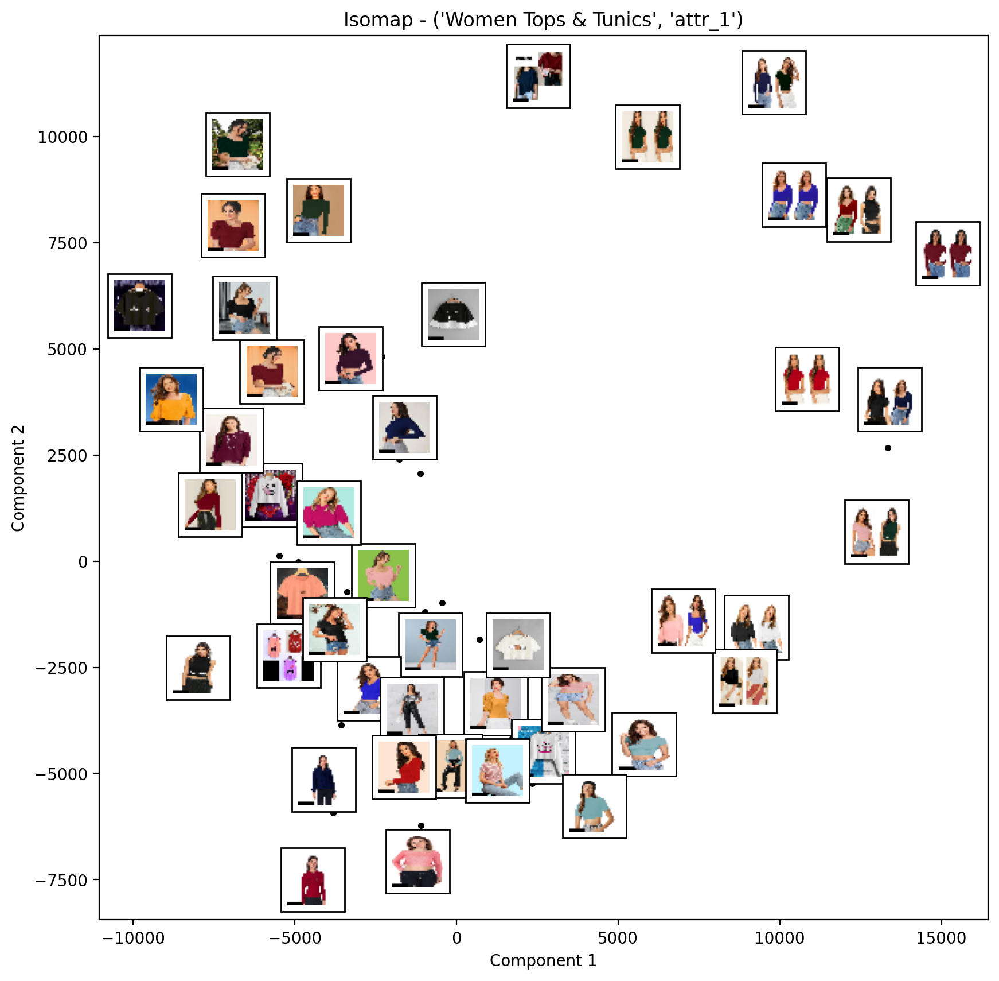

In [18]:
fig, ax = plt.subplots(figsize=(10, 10), dpi=200)
test_basket = samples[baskets[i]]
test_basket = [str(x).zfill(6) for x in test_basket]
temp_df = image_df.loc[test_basket]
image_pixels = np.array([full_image_data[filename] for filename in test_basket])
ax.set_title("Isomap - " + str(baskets[i]))
plot_components(temp_df, model1, images=image_pixels, ax=ax, thumb_frac=0.05)
plt.show()
i += 1

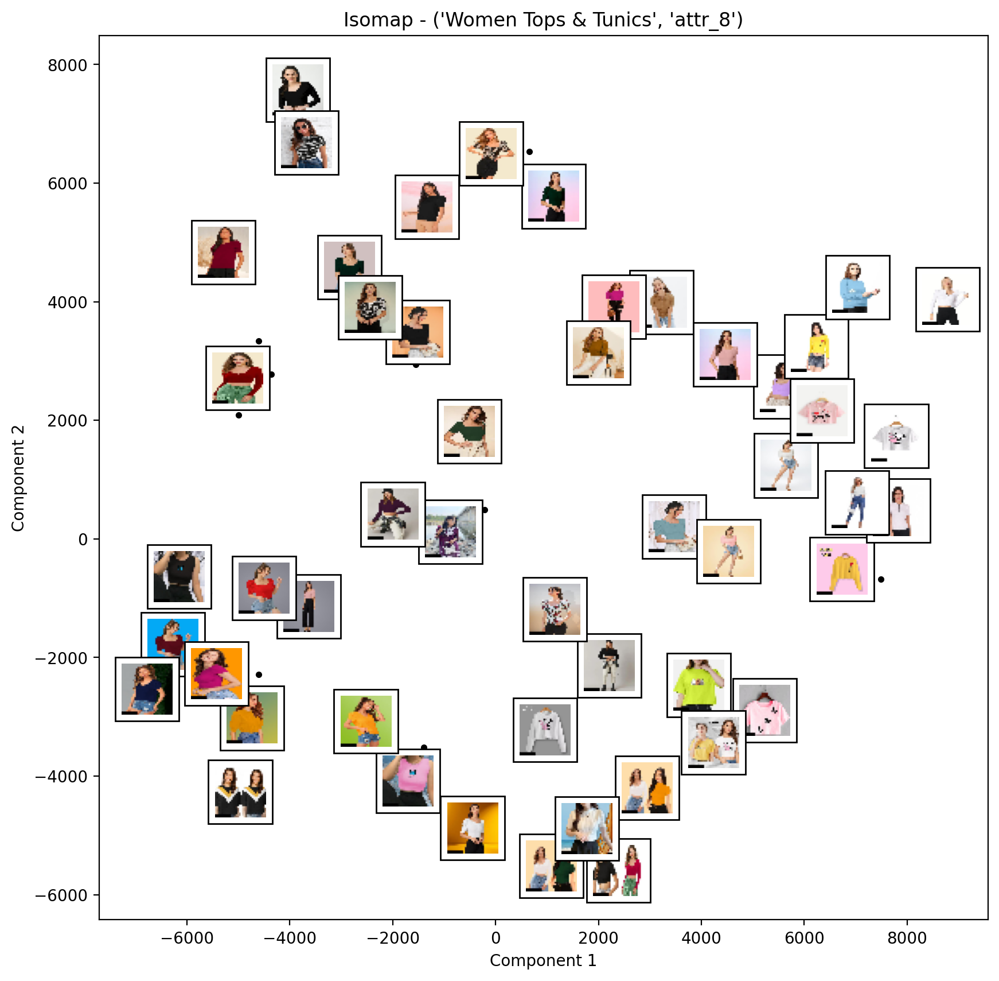

In [19]:
fig, ax = plt.subplots(figsize=(10, 10), dpi=200)
test_basket = samples[baskets[i]]
test_basket = [str(x).zfill(6) for x in test_basket]
temp_df = image_df.loc[test_basket]
image_pixels = np.array([full_image_data[filename] for filename in test_basket])
ax.set_title("Isomap - " + str(baskets[i]))
plot_components(temp_df, model1, images=image_pixels, ax=ax, thumb_frac=0.05)
plt.show()
i += 1

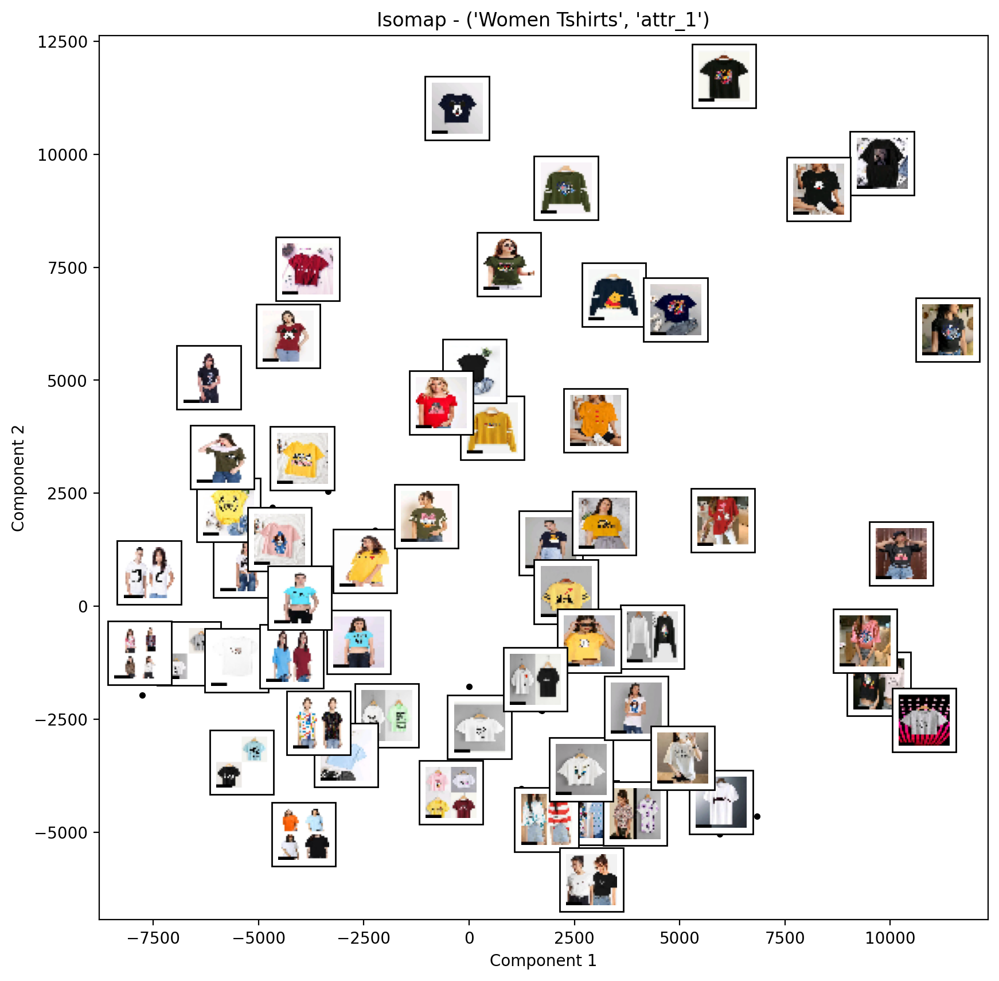

In [20]:
fig, ax = plt.subplots(figsize=(10, 10), dpi=200)
test_basket = samples[baskets[i]]
test_basket = [str(x).zfill(6) for x in test_basket]
temp_df = image_df.loc[test_basket]
image_pixels = np.array([full_image_data[filename] for filename in test_basket])
ax.set_title("Isomap - " + str(baskets[i]))
plot_components(temp_df, model1, images=image_pixels, ax=ax, thumb_frac=0.05)
plt.show()
i += 1

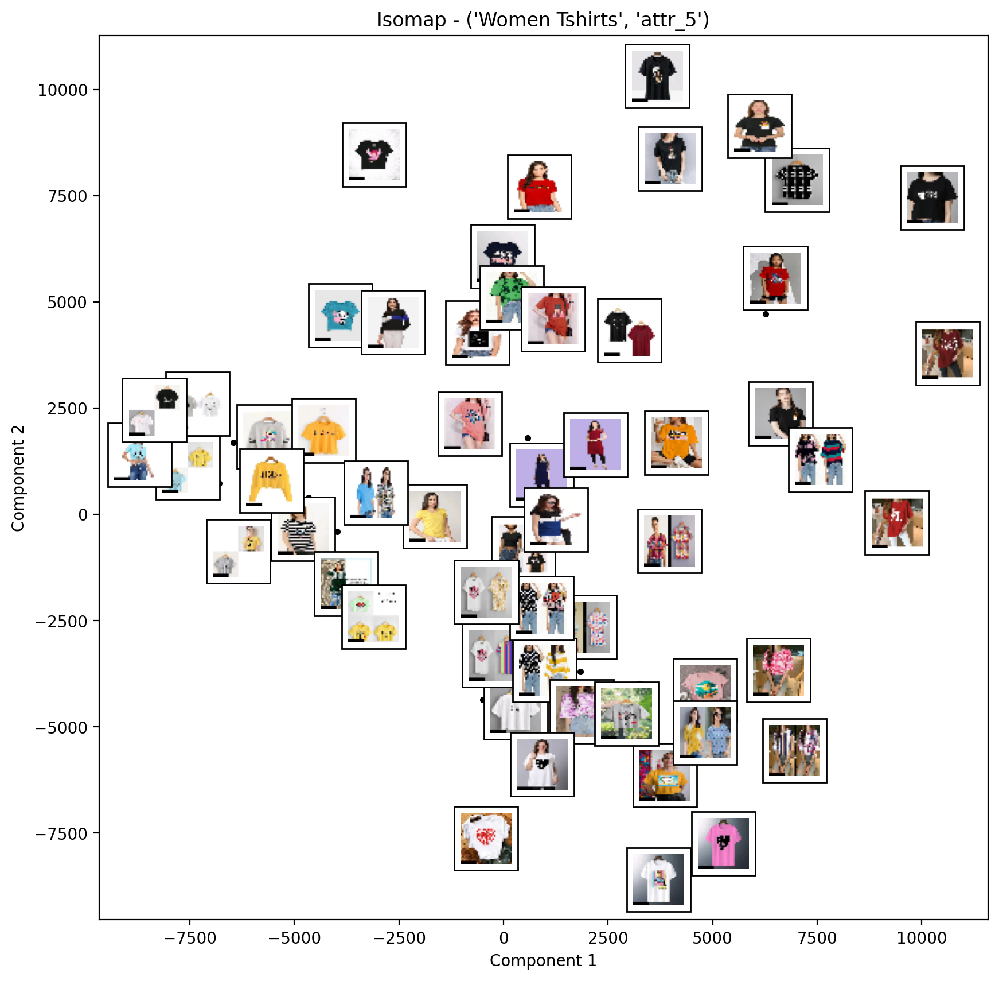

In [21]:
fig, ax = plt.subplots(figsize=(10, 10), dpi=200)
test_basket = samples[baskets[i]]
test_basket = [str(x).zfill(6) for x in test_basket]
temp_df = image_df.loc[test_basket]
image_pixels = np.array([full_image_data[filename] for filename in test_basket])
ax.set_title("Isomap - " + str(baskets[i]))
plot_components(temp_df, model1, images=image_pixels, ax=ax, thumb_frac=0.05)
plt.show()
i += 1

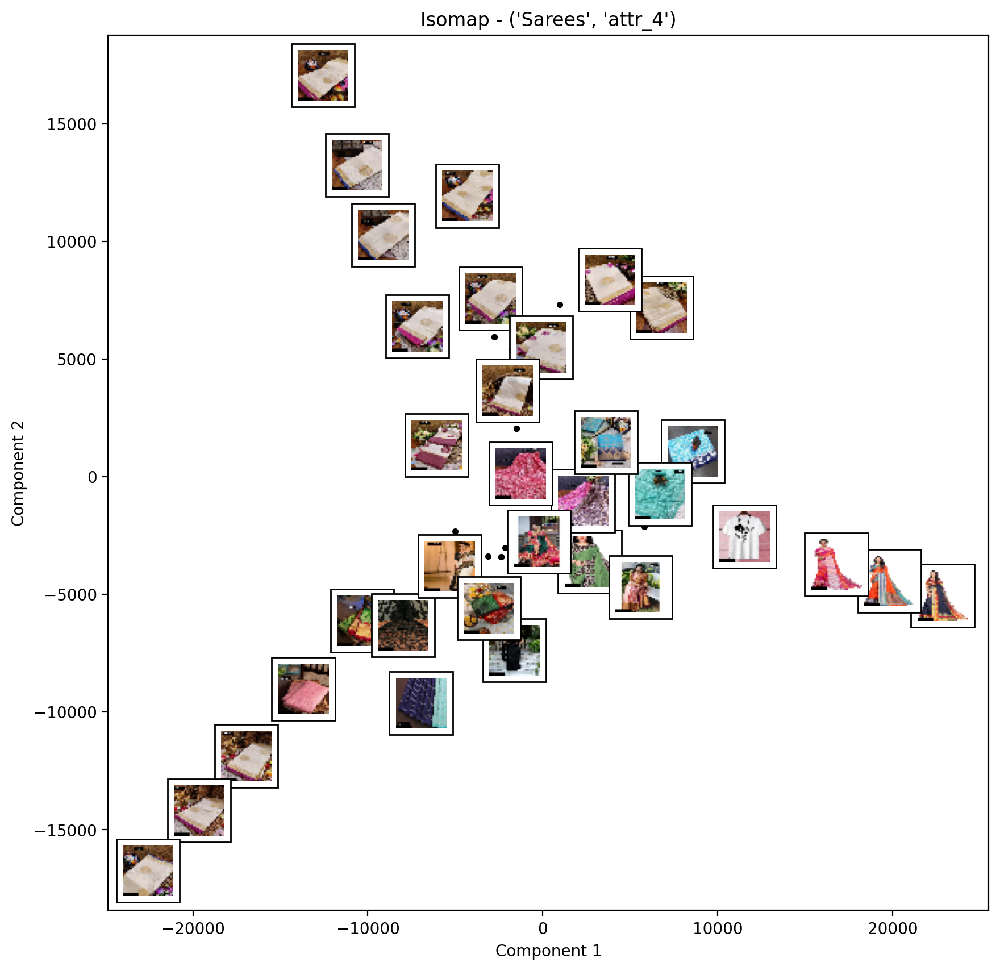

In [22]:
fig, ax = plt.subplots(figsize=(10, 10), dpi=200)
test_basket = samples[baskets[i]]
test_basket = [str(x).zfill(6) for x in test_basket]
temp_df = image_df.loc[test_basket]
image_pixels = np.array([full_image_data[filename] for filename in test_basket])
ax.set_title("Isomap - " + str(baskets[i]))
plot_components(temp_df, model1, images=image_pixels, ax=ax, thumb_frac=0.05)
plt.show()
i += 1

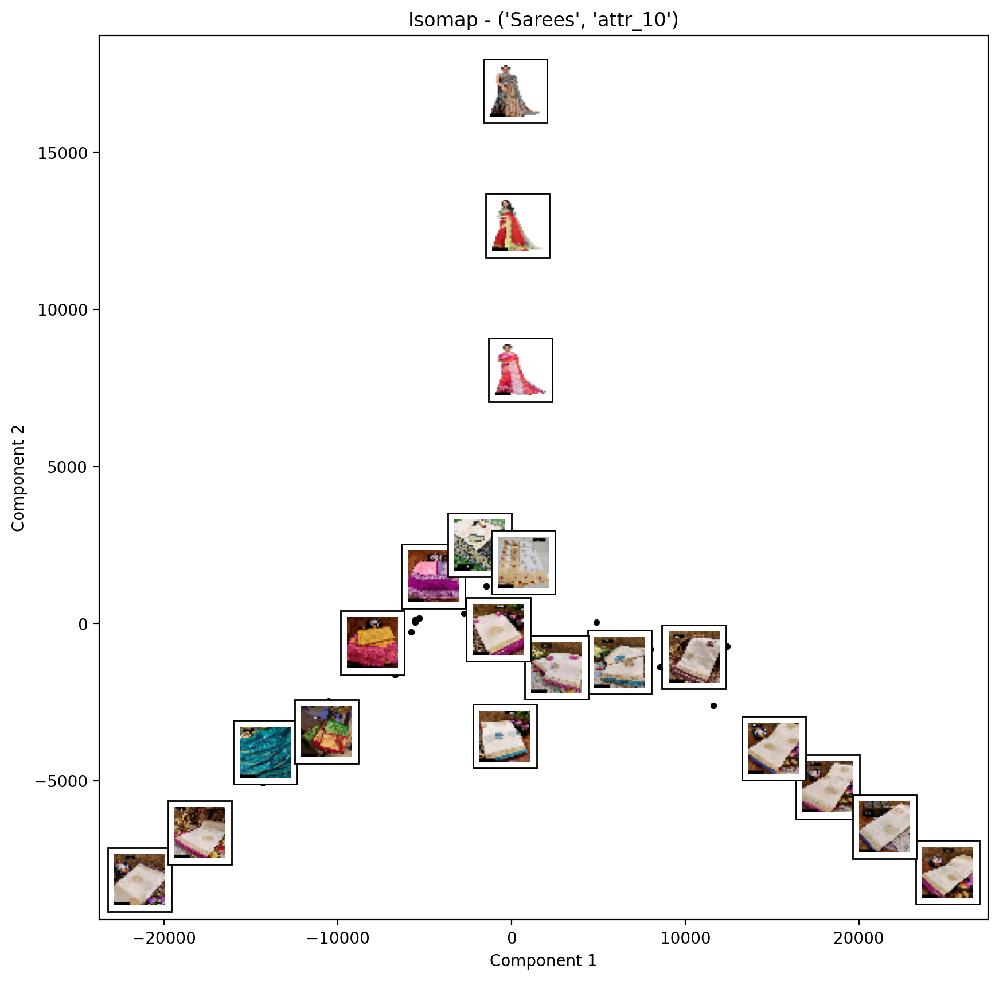

In [23]:
fig, ax = plt.subplots(figsize=(10, 10), dpi=200)
test_basket = samples[baskets[i]]
test_basket = [str(x).zfill(6) for x in test_basket]
temp_df = image_df.loc[test_basket]
image_pixels = np.array([full_image_data[filename] for filename in test_basket])
ax.set_title("Isomap - " + str(baskets[i]))
plot_components(temp_df, model1, images=image_pixels, ax=ax, thumb_frac=0.05)
plt.show()
i += 1

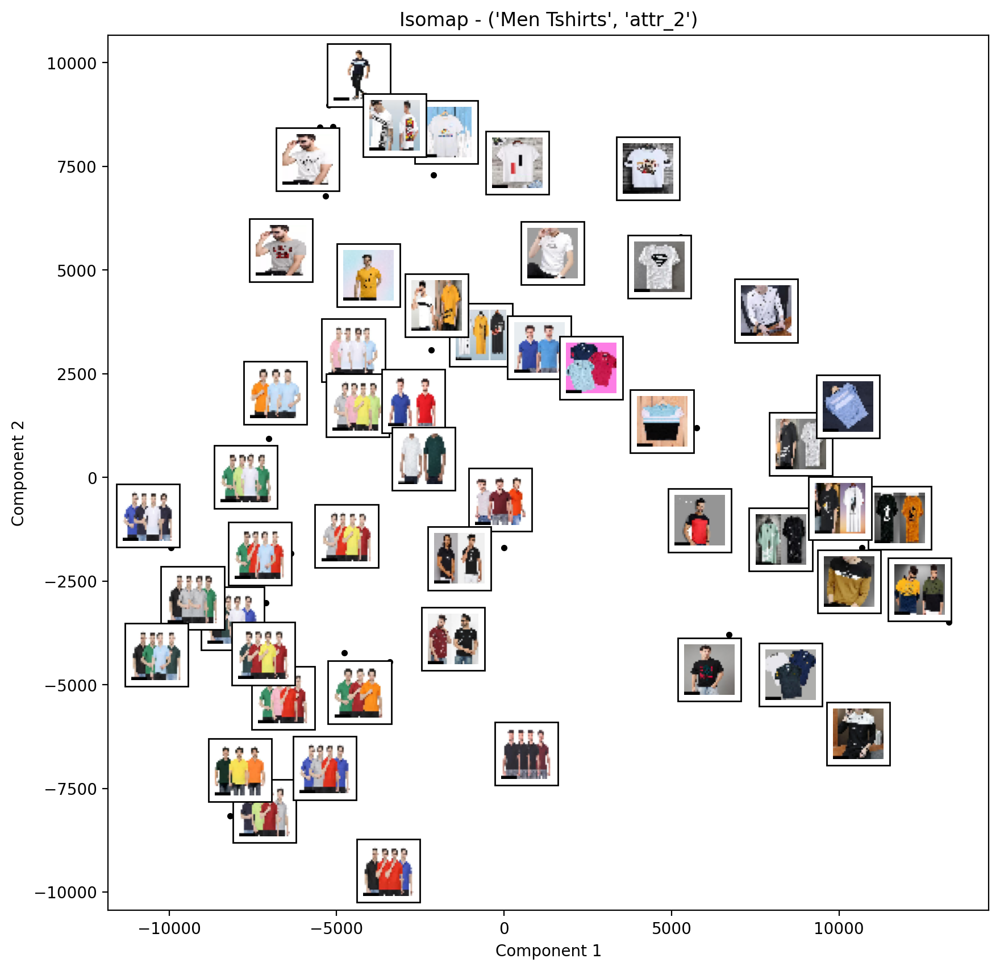

In [24]:
fig, ax = plt.subplots(figsize=(10, 10), dpi=200)
test_basket = samples[baskets[i]]
test_basket = [str(x).zfill(6) for x in test_basket]
temp_df = image_df.loc[test_basket]
image_pixels = np.array([full_image_data[filename] for filename in test_basket])
ax.set_title("Isomap - " + str(baskets[i]))
plot_components(temp_df, model1, images=image_pixels, ax=ax, thumb_frac=0.05)
plt.show()
i += 1

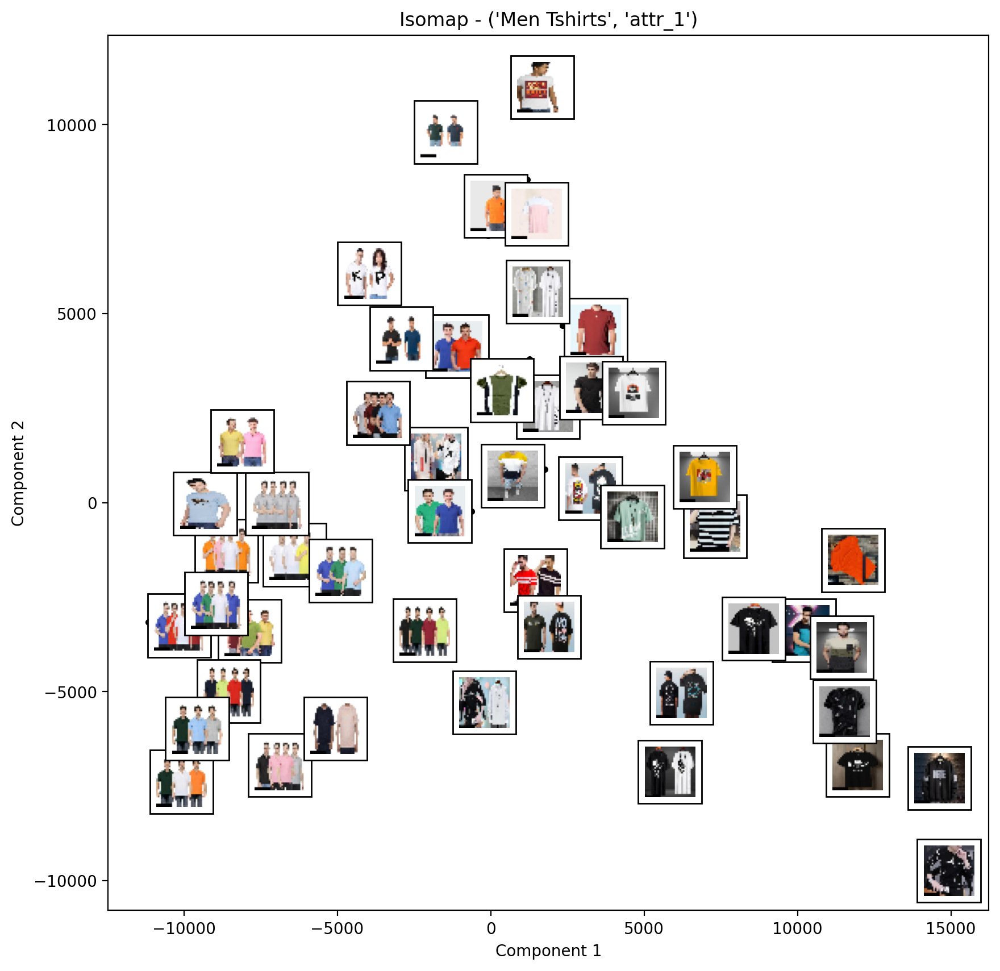

In [25]:
fig, ax = plt.subplots(figsize=(10, 10), dpi=200)
test_basket = samples[baskets[i]]
test_basket = [str(x).zfill(6) for x in test_basket]
temp_df = image_df.loc[test_basket]
image_pixels = np.array([full_image_data[filename] for filename in test_basket])
ax.set_title("Isomap - " + str(baskets[i]))
plot_components(temp_df, model1, images=image_pixels, ax=ax, thumb_frac=0.05)
plt.show()
i += 1

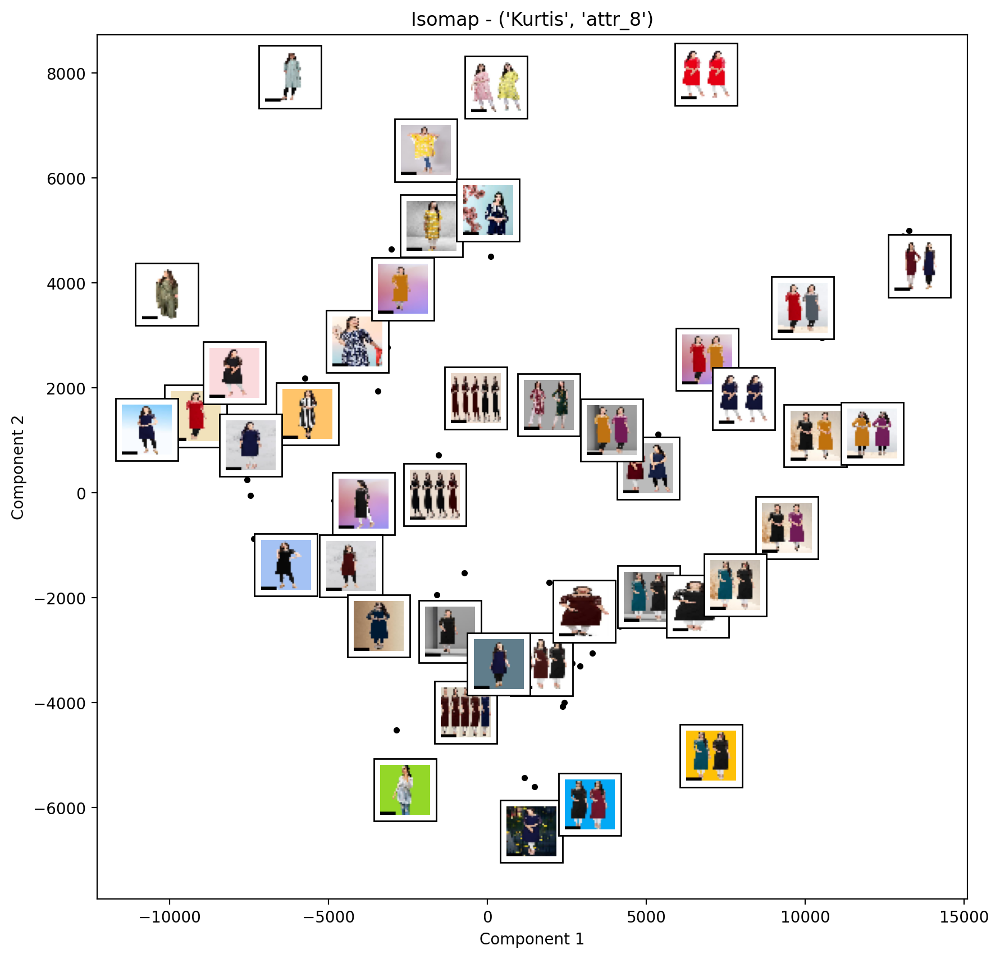

In [26]:
fig, ax = plt.subplots(figsize=(10, 10), dpi=200)
test_basket = samples[baskets[i]]
test_basket = [str(x).zfill(6) for x in test_basket]
temp_df = image_df.loc[test_basket]
image_pixels = np.array([full_image_data[filename] for filename in test_basket])
ax.set_title("Isomap - " + str(baskets[i]))
plot_components(temp_df, model1, images=image_pixels, ax=ax, thumb_frac=0.05)
plt.show()
i += 1

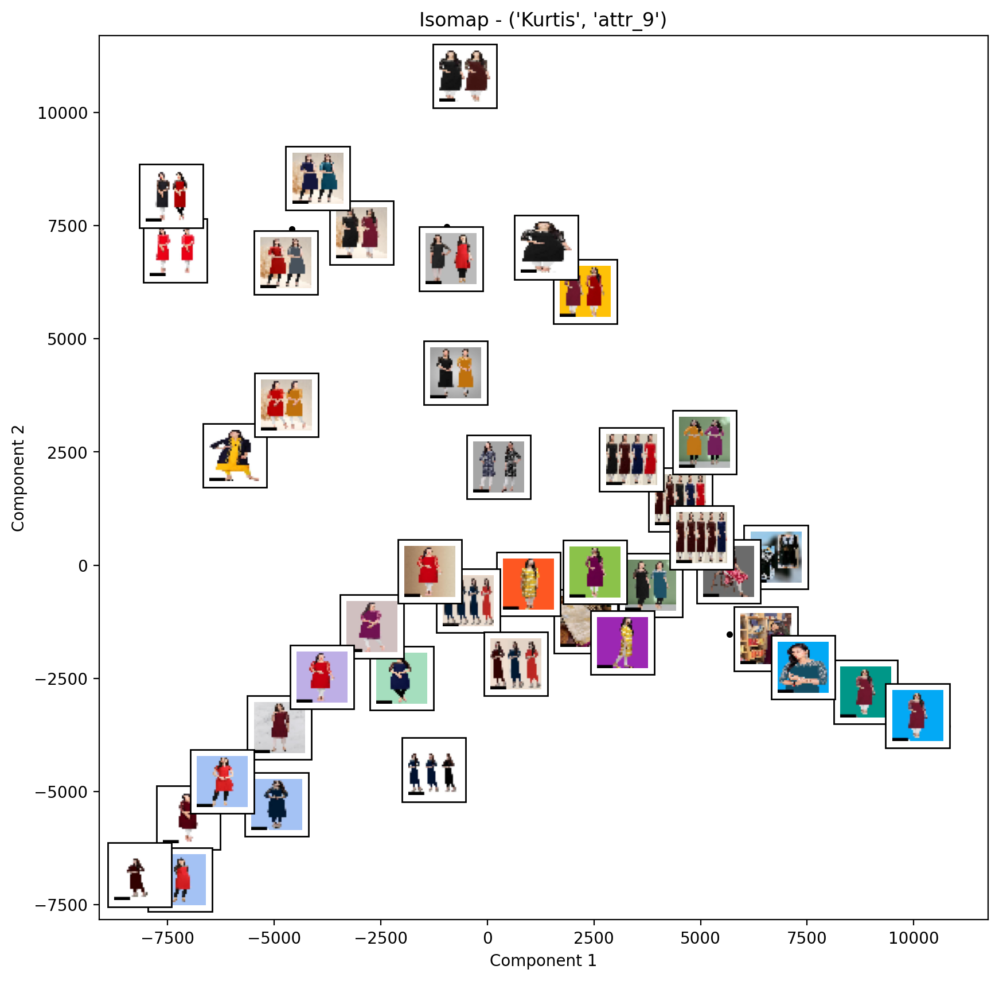

In [27]:
fig, ax = plt.subplots(figsize=(10, 10), dpi=200)
test_basket = samples[baskets[i]]
test_basket = [str(x).zfill(6) for x in test_basket]
temp_df = image_df.loc[test_basket]
image_pixels = np.array([full_image_data[filename] for filename in test_basket])
ax.set_title("Isomap - " + str(baskets[i]))
plot_components(temp_df, model1, images=image_pixels, ax=ax, thumb_frac=0.05)
plt.show()

In the case of Isomap, Component 1, in general, seems to describe the **number of clothes** in the image. As we move from left to right, the number of clothes changes.

Component 2, in general, seems to describe the **colour brightness** of the clothes. As we move across this components, the colour of the clothes changes from darker shades to lighter shades.

**t-SNE**

We then perform the same visualization using t-SNE.

In [28]:
from sklearn.manifold import TSNE
model2 = TSNE(n_components=2)

In [29]:
baskets = list(samples.keys())
i = 0

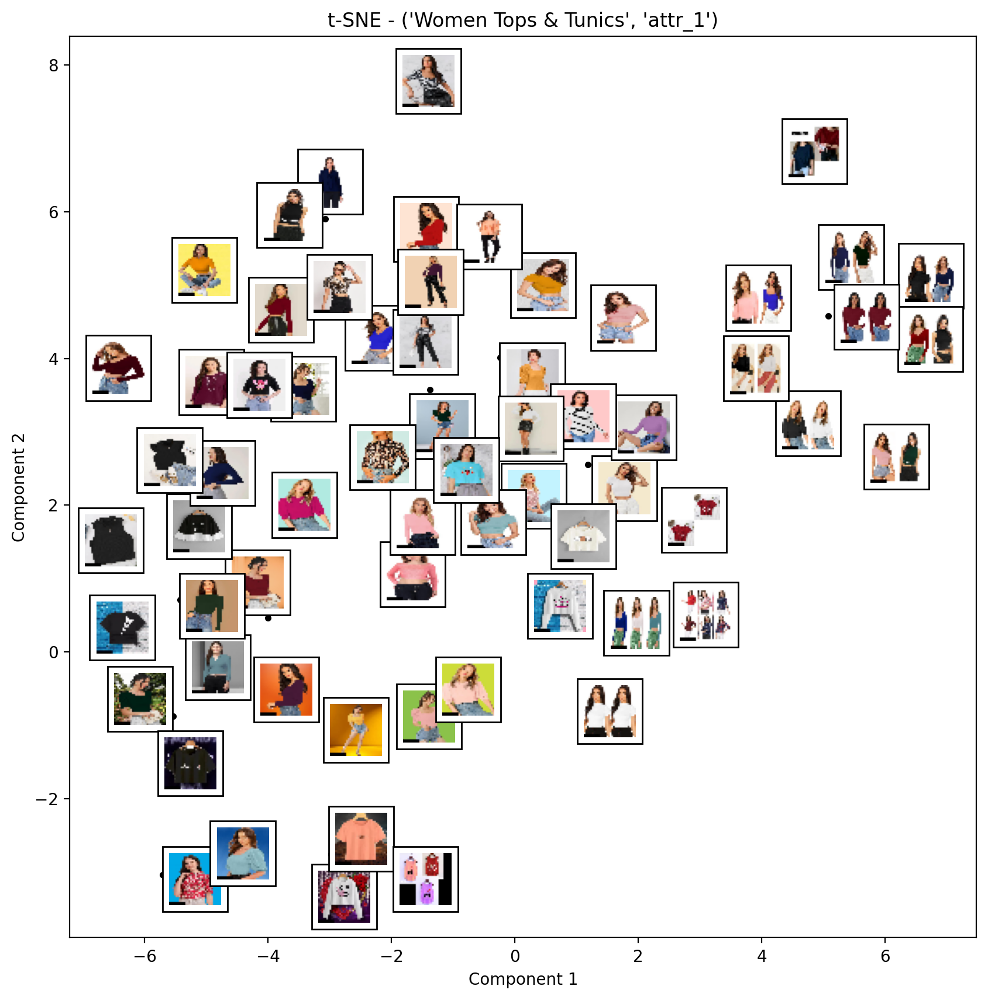

In [30]:
fig, ax = plt.subplots(figsize=(10, 10), dpi=200)
test_basket = samples[baskets[i]]
test_basket = [str(x).zfill(6) for x in test_basket]
temp_df = image_df.loc[test_basket]
image_pixels = np.array([full_image_data[filename] for filename in test_basket])
ax.set_title("t-SNE - " + str(baskets[i]))
plot_components(temp_df, model2, images=image_pixels, ax=ax, thumb_frac=0.05)
plt.show()
i += 1

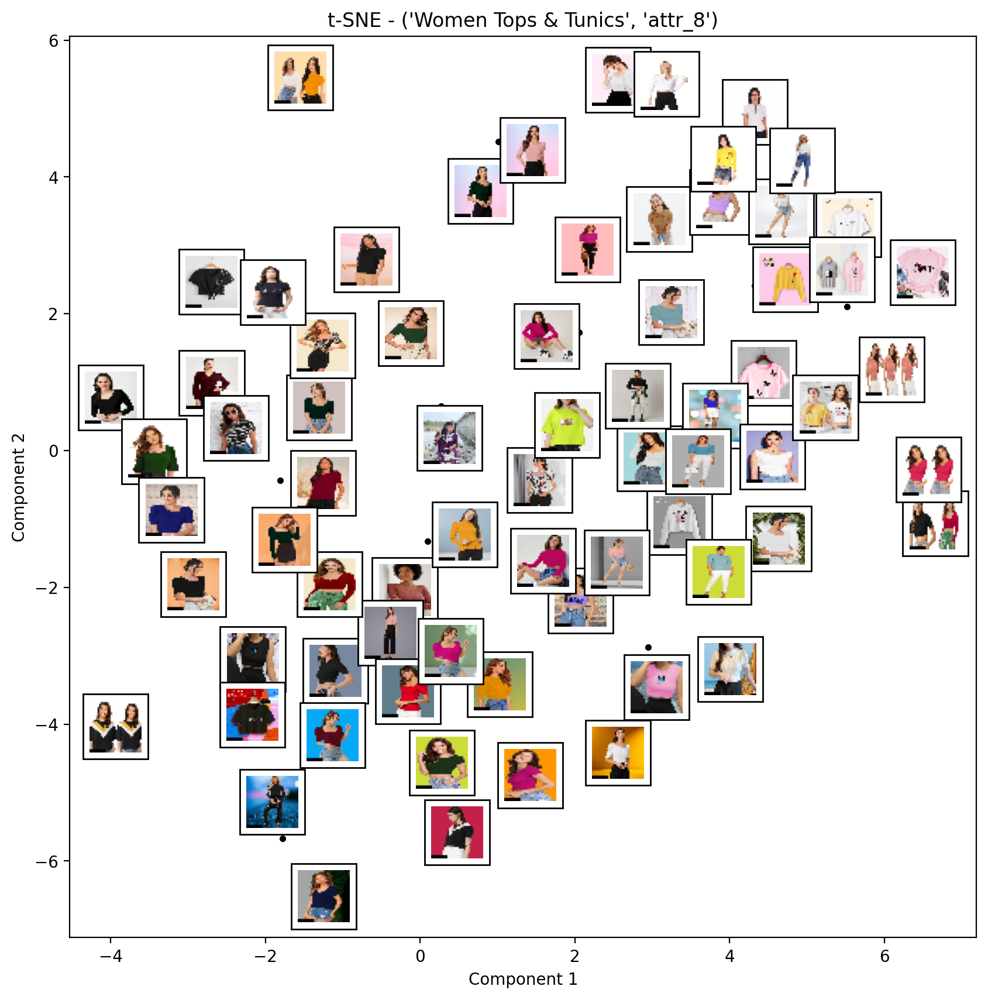

In [31]:
fig, ax = plt.subplots(figsize=(10, 10), dpi=200)
test_basket = samples[baskets[i]]
test_basket = [str(x).zfill(6) for x in test_basket]
temp_df = image_df.loc[test_basket]
image_pixels = np.array([full_image_data[filename] for filename in test_basket])
ax.set_title("t-SNE - " + str(baskets[i]))
plot_components(temp_df, model2, images=image_pixels, ax=ax, thumb_frac=0.05)
plt.show()
i += 1

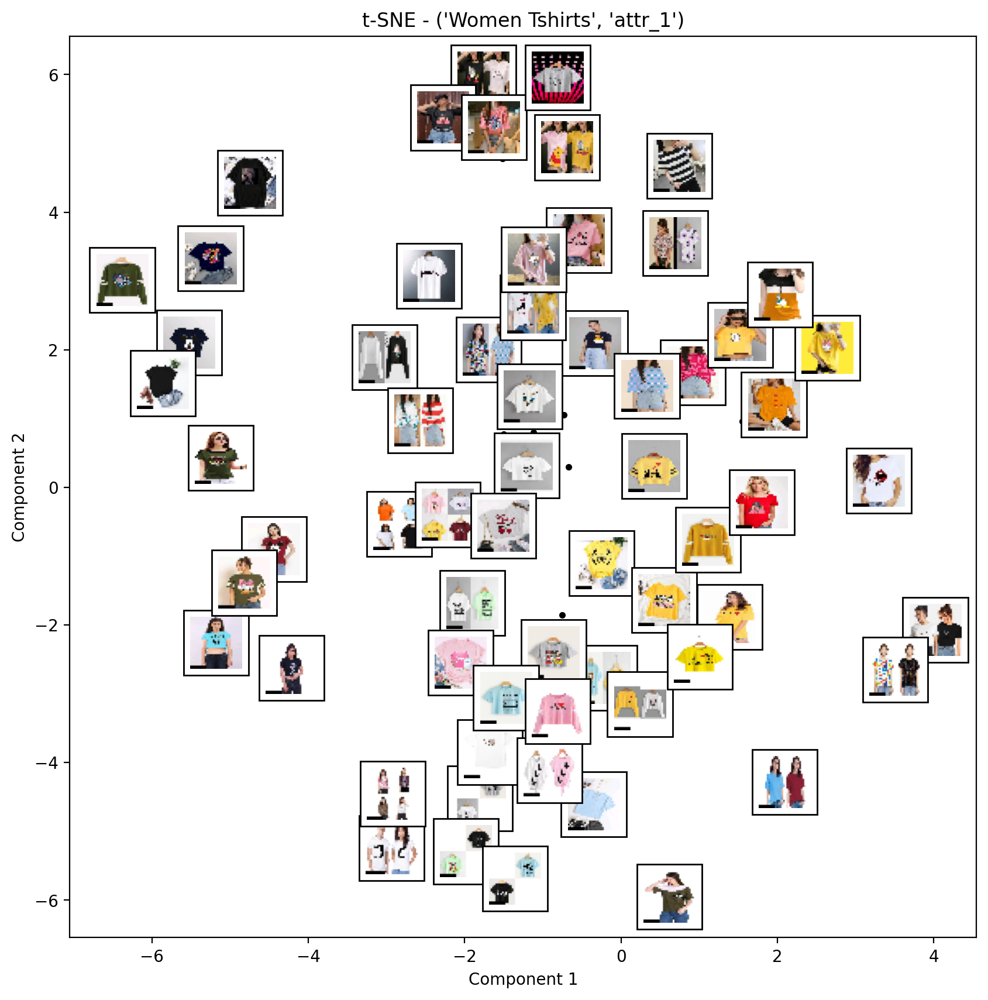

In [32]:
fig, ax = plt.subplots(figsize=(10, 10), dpi=200)
test_basket = samples[baskets[i]]
test_basket = [str(x).zfill(6) for x in test_basket]
temp_df = image_df.loc[test_basket]
image_pixels = np.array([full_image_data[filename] for filename in test_basket])
ax.set_title("t-SNE - " + str(baskets[i]))
plot_components(temp_df, model2, images=image_pixels, ax=ax, thumb_frac=0.05)
plt.show()
i += 1

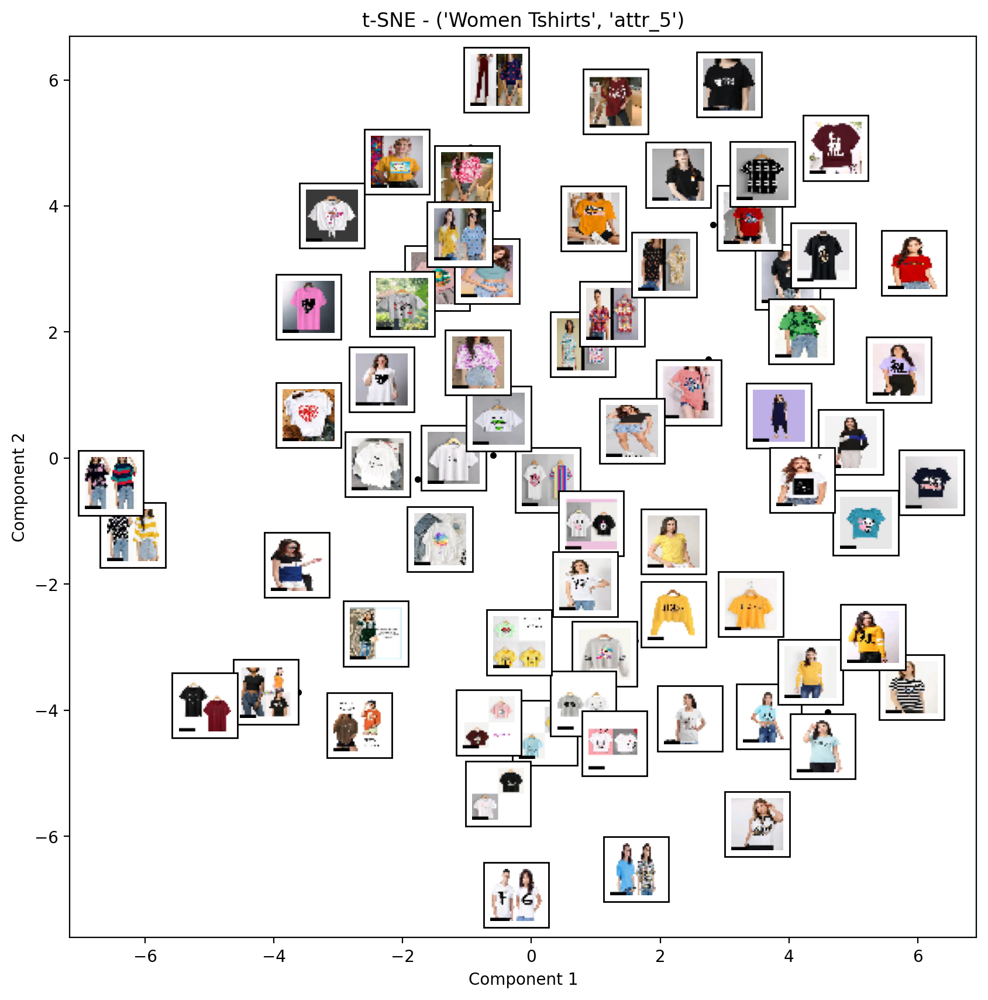

In [33]:
fig, ax = plt.subplots(figsize=(10, 10), dpi=200)
test_basket = samples[baskets[i]]
test_basket = [str(x).zfill(6) for x in test_basket]
temp_df = image_df.loc[test_basket]
image_pixels = np.array([full_image_data[filename] for filename in test_basket])
ax.set_title("t-SNE - " + str(baskets[i]))
plot_components(temp_df, model2, images=image_pixels, ax=ax, thumb_frac=0.05)
plt.show()
i += 1

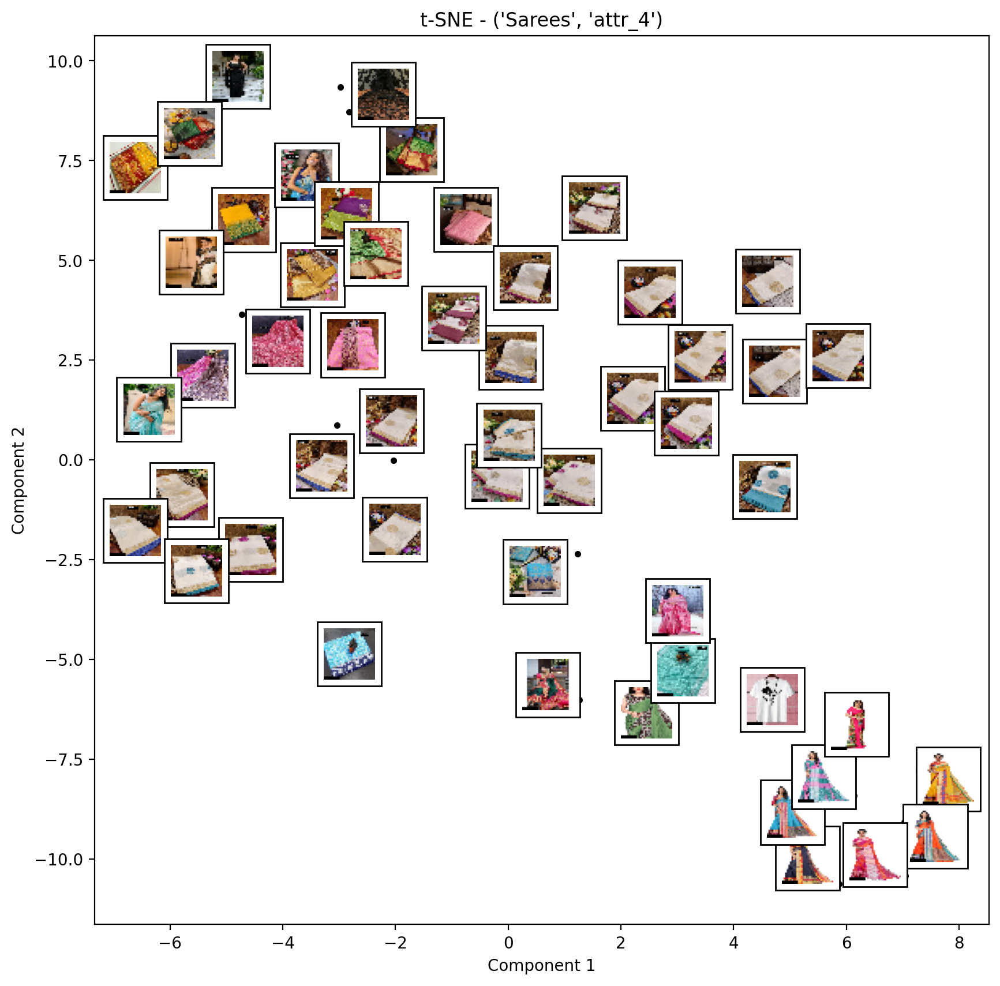

In [34]:
fig, ax = plt.subplots(figsize=(10, 10), dpi=200)
test_basket = samples[baskets[i]]
test_basket = [str(x).zfill(6) for x in test_basket]
temp_df = image_df.loc[test_basket]
image_pixels = np.array([full_image_data[filename] for filename in test_basket])
ax.set_title("t-SNE - " + str(baskets[i]))
plot_components(temp_df, model2, images=image_pixels, ax=ax, thumb_frac=0.05)
plt.show()
i += 1

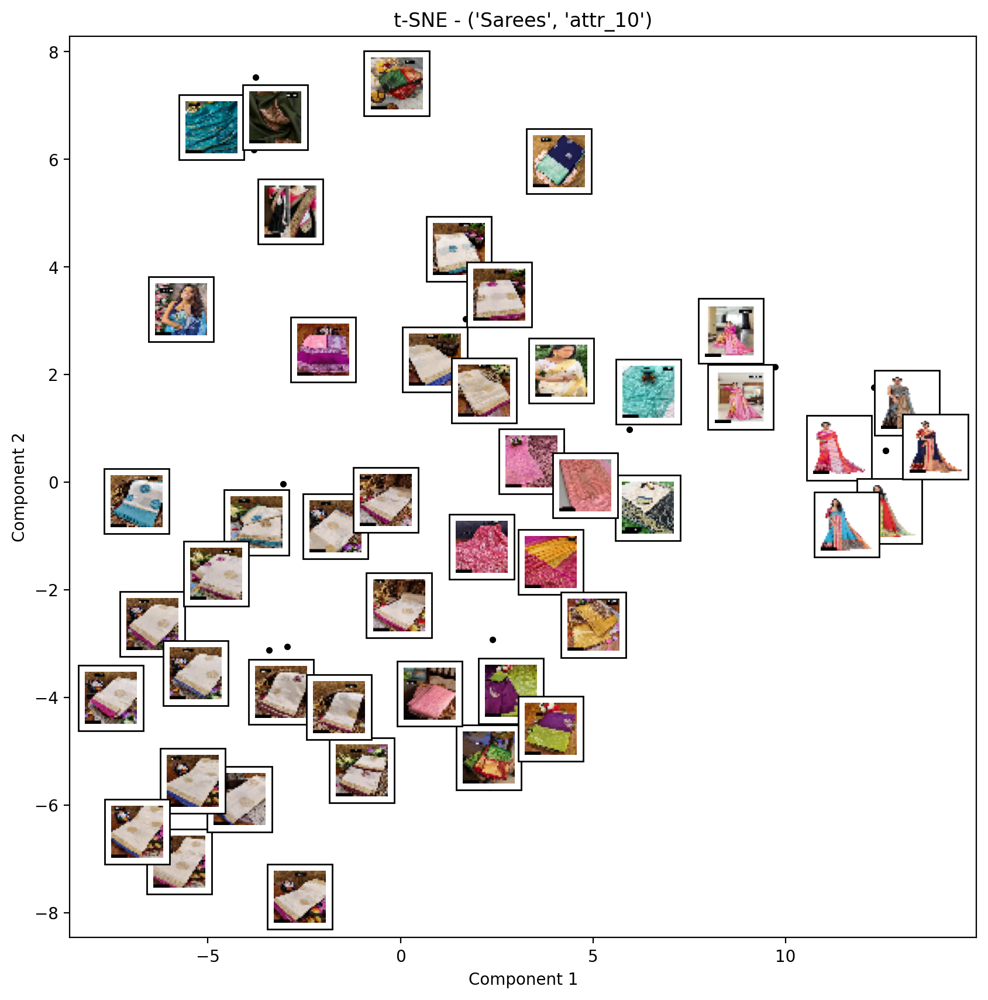

In [35]:
fig, ax = plt.subplots(figsize=(10, 10), dpi=200)
test_basket = samples[baskets[i]]
test_basket = [str(x).zfill(6) for x in test_basket]
temp_df = image_df.loc[test_basket]
image_pixels = np.array([full_image_data[filename] for filename in test_basket])
ax.set_title("t-SNE - " + str(baskets[i]))
plot_components(temp_df, model2, images=image_pixels, ax=ax, thumb_frac=0.05)
plt.show()
i += 1

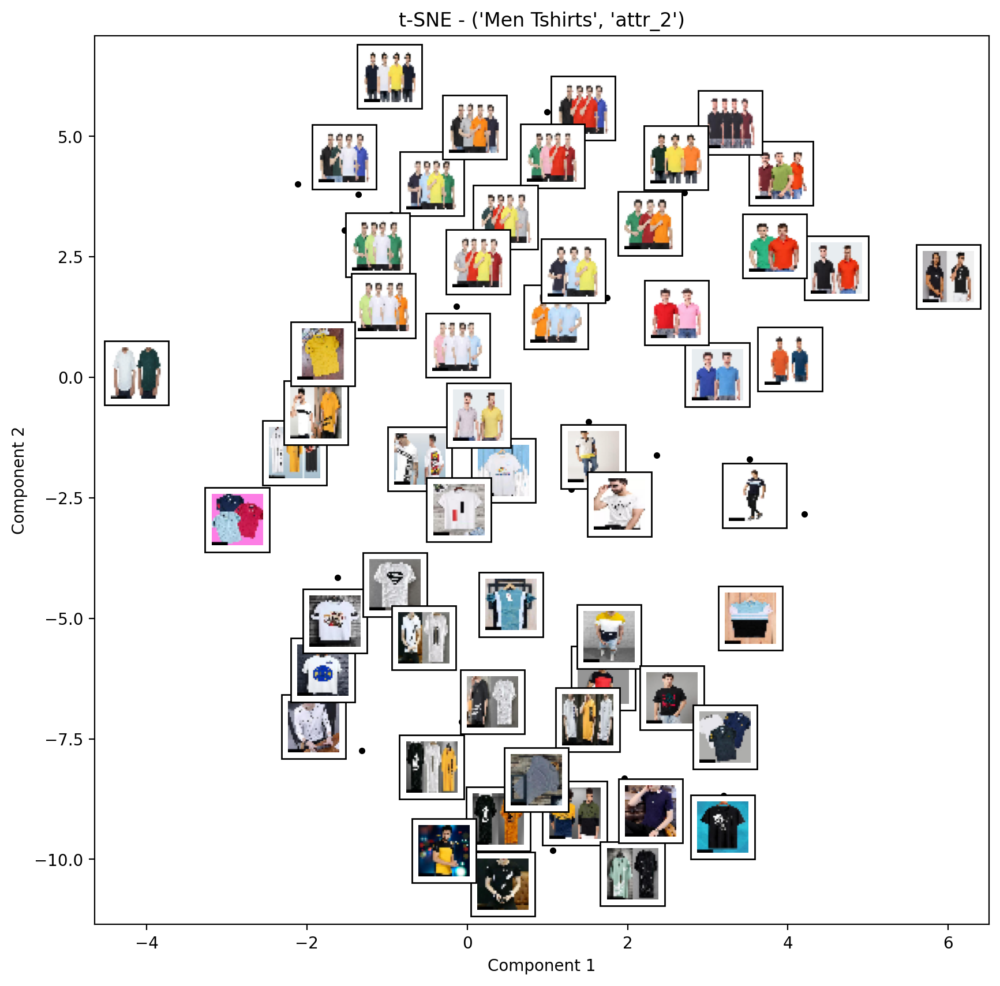

In [36]:
fig, ax = plt.subplots(figsize=(10, 10), dpi=200)
test_basket = samples[baskets[i]]
test_basket = [str(x).zfill(6) for x in test_basket]
temp_df = image_df.loc[test_basket]
image_pixels = np.array([full_image_data[filename] for filename in test_basket])
ax.set_title("t-SNE - " + str(baskets[i]))
plot_components(temp_df, model2, images=image_pixels, ax=ax, thumb_frac=0.05)
plt.show()
i += 1

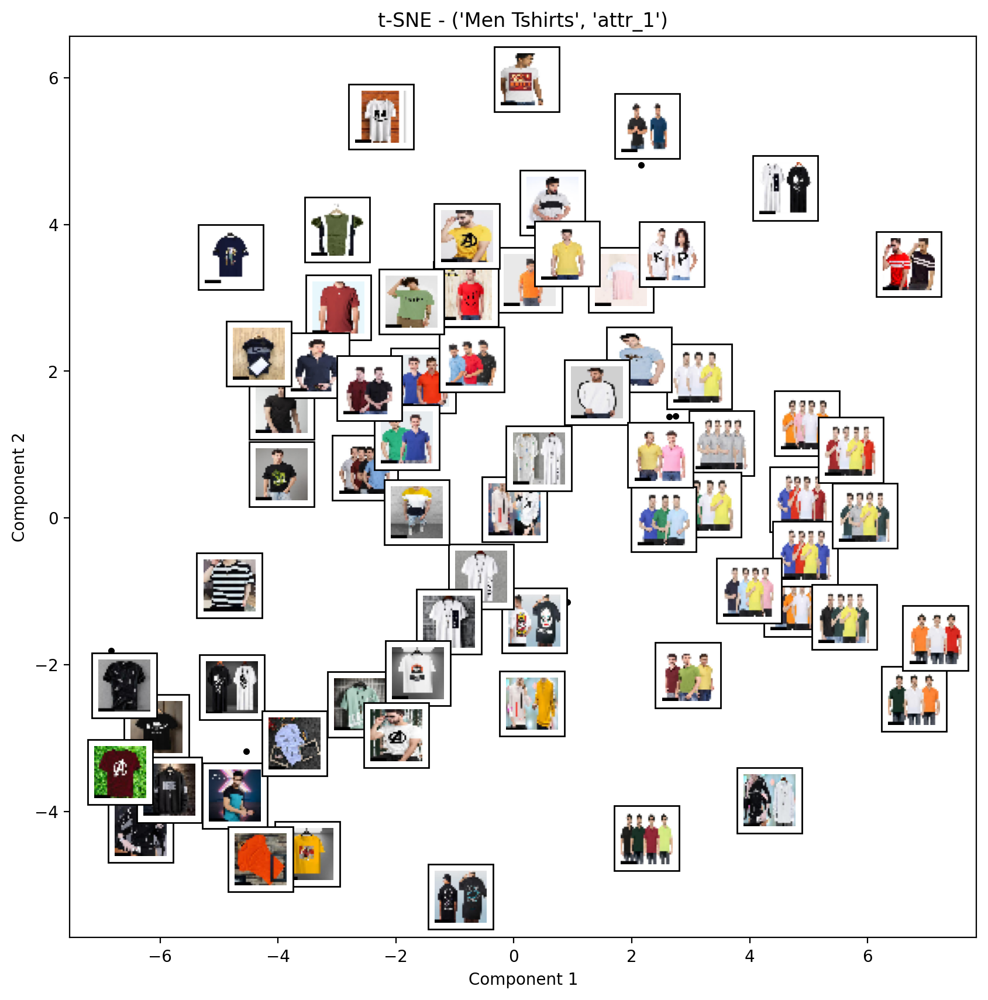

In [37]:
fig, ax = plt.subplots(figsize=(10, 10), dpi=200)
test_basket = samples[baskets[i]]
test_basket = [str(x).zfill(6) for x in test_basket]
temp_df = image_df.loc[test_basket]
image_pixels = np.array([full_image_data[filename] for filename in test_basket])
ax.set_title("t-SNE - " + str(baskets[i]))
plot_components(temp_df, model2, images=image_pixels, ax=ax, thumb_frac=0.05)
plt.show()
i += 1

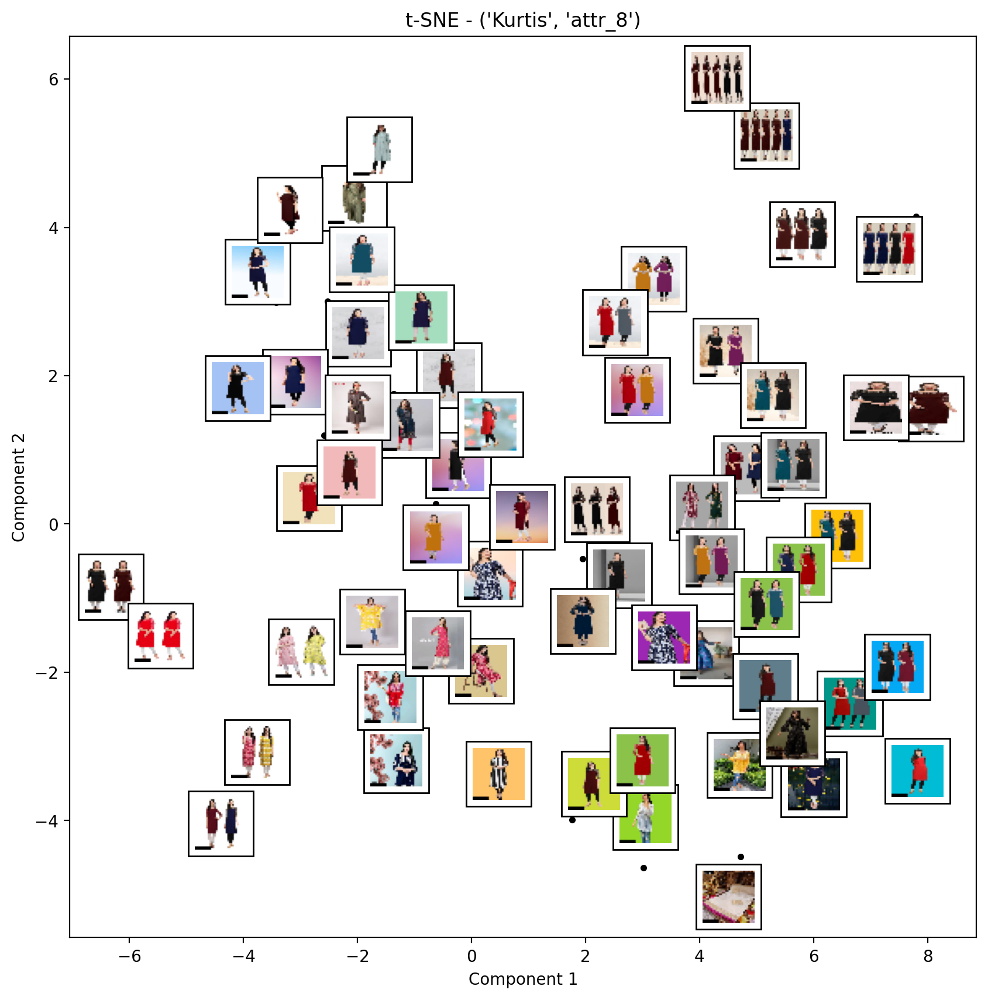

In [38]:
fig, ax = plt.subplots(figsize=(10, 10), dpi=200)
test_basket = samples[baskets[i]]
test_basket = [str(x).zfill(6) for x in test_basket]
temp_df = image_df.loc[test_basket]
image_pixels = np.array([full_image_data[filename] for filename in test_basket])
ax.set_title("t-SNE - " + str(baskets[i]))
plot_components(temp_df, model2, images=image_pixels, ax=ax, thumb_frac=0.05)
plt.show()
i += 1

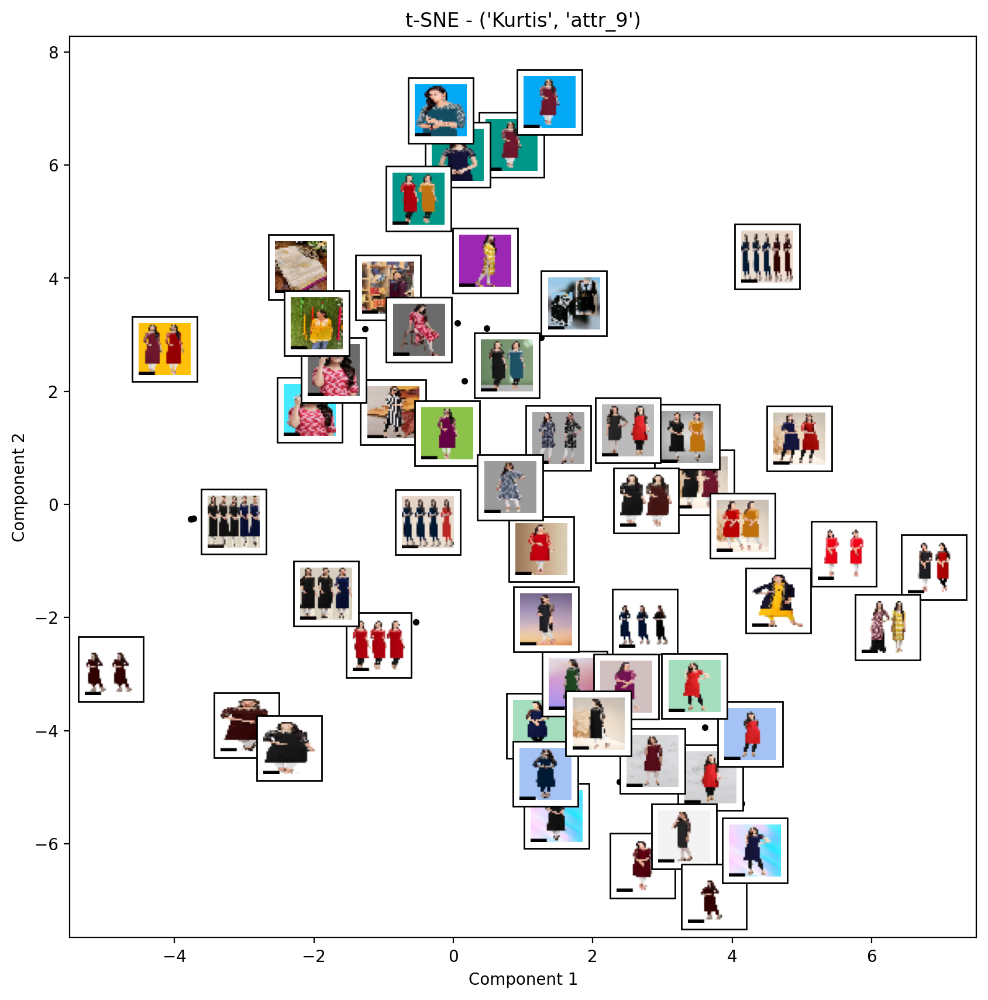

In [39]:
fig, ax = plt.subplots(figsize=(10, 10), dpi=200)
test_basket = samples[baskets[i]]
test_basket = [str(x).zfill(6) for x in test_basket]
temp_df = image_df.loc[test_basket]
image_pixels = np.array([full_image_data[filename] for filename in test_basket])
ax.set_title("t-SNE - " + str(baskets[i]))
plot_components(temp_df, model2, images=image_pixels, ax=ax, thumb_frac=0.05)
plt.show()

In the case of t-SNE, Component 1, in general, seems to describe the **colour brightness** of the clothes. As we move across this components, the colour of the clothes changes from darker shades to lighter shades.

Component 2, in general, seems to describe the **number of clothes** in the image. As we move from left to right, the number of clothes changes.

This is just the opposite of the components discovered by Isomap.